In [81]:
import os
import glob

import cv2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [82]:
BASE_DIR = "/working/"
INPUT_DIR = os.path.join(BASE_DIR, "input")
CFG = {
    "TRAIN_INK_CSV" : [os.path.join(INPUT_DIR, "train", "1", "inklabels_rle.csv"),
                        os.path.join(INPUT_DIR, "train", "2", "inklabels_rle.csv"),
                        os.path.join(INPUT_DIR, "train", "3", "inklabels_rle.csv"),
                        ],
    "TEST_CSV" : os.path.join(INPUT_DIR, "test.csv"),
    "SUB_CSV" : os.path.join(INPUT_DIR, "sample_submission.csv"),
}

In [83]:
def fft_transform(img):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    return magnitude_spectrum

In [138]:
def highpass_filter(img):
    frange = 1
    dft = cv2.dft(np.float32(img),flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    rows, cols = img.shape
    crow,ccol = rows//2 , cols//2

    # create a mask first, center square is 1, remaining all zeros
    mask = np.ones((rows,cols,2),np.uint8)
    mask[crow-frange:crow+frange, ccol-frange:ccol+frange] = 0

    # apply mask and inverse DFT
    fshift = dft_shift*mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

    return img_back

In [136]:
def lowpass_filter(img):
    frange = 10
    dft = cv2.dft(np.float32(img),flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    rows, cols = img.shape
    crow,ccol = rows//2 , cols//2

    # create a mask first, center square is 1, remaining all zeros
    mask = np.zeros((rows,cols,2),np.uint8)
    mask[crow-frange:crow+frange, ccol-frange:ccol+frange] = 1

    # apply mask and inverse DFT
    fshift = dft_shift*mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

    return img_back

In [86]:
def plot_surface_and_fft(surface_vol_list, subplot_num, grid_idx, img_size):
    plt.figure(figsize=(20, 20))
    for idx, sur_idx in enumerate(subplot_num):
        plt.subplot(1, len(subplot_num), idx+1)
        # surface_img = cv2.imread(surface_vol_list[sur_idx], cv2.IMREAD_GRAYSCALE)
        surface_img = surface_vol_list[sur_idx]
        surface_img = surface_img[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                                    grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]
    
        plt.imshow(surface_img, cmap="gray")
    plt.show()

    plt.figure(figsize=(20,20))
    for idx, sur_idx in enumerate(subplot_num):
        plt.subplot(1, len(subplot_num), idx+1)
        # surface_img = cv2.imread(surface_vol_list[sur_idx], cv2.IMREAD_GRAYSCALE)
        surface_img = surface_vol_list[sur_idx]
        surface_img = surface_img[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                                    grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]
        surface_img = fft_transform(surface_img)
        plt.imshow(surface_img, cmap="gray")
    plt.show()

In [127]:
def plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size):
    print("original surface")
    plt.figure(figsize=(20, 20))
    for idx, sur_idx in enumerate(subplot_num):
        plt.subplot(1, len(subplot_num), idx+1)
        # surface_img = cv2.imread(surface_vol_list[sur_idx], cv2.IMREAD_GRAYSCALE)
        surface_img = surface_vol_list[sur_idx]
        surface_img = surface_img[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                                    grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]
    
        plt.imshow(surface_img, cmap="gray")
    plt.show()

    print("highpass_filter")
    hpf_value_list = []
    plt.figure(figsize=(20,20))
    for idx, sur_idx in enumerate(subplot_num):
        plt.subplot(1, len(subplot_num), idx+1)
        # surface_img = cv2.imread(surface_vol_list[sur_idx], cv2.IMREAD_GRAYSCALE)
        surface_img = surface_vol_list[sur_idx]
        surface_img = surface_img[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                                    grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]
        surface_img = highpass_filter(surface_img)
        surface_img_sum = np.mean(surface_img)/surface_img.shape[0]/surface_img.shape[1]
        hpf_value_list.append(surface_img_sum)
        plt.imshow(surface_img, cmap="gray")
    plt.show()
    print(hpf_value_list)

    print("lowpass_filter")
    lpf_value_list = []
    plt.figure(figsize=(20,20))
    for idx, sur_idx in enumerate(subplot_num):
        plt.subplot(1, len(subplot_num), idx+1)
        # surface_img = cv2.imread(surface_vol_list[sur_idx], cv2.IMREAD_GRAYSCALE)
        surface_img = surface_vol_list[sur_idx]
        surface_img = surface_img[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                                    grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]
        surface_img = lowpass_filter(surface_img)
        surface_img_sum = np.mean(surface_img)/surface_img.shape[0]/surface_img.shape[1]
        lpf_value_list.append(surface_img_sum)
        plt.imshow(surface_img, cmap="gray")
    plt.show()
    print(lpf_value_list)

In [88]:
inklabel_path = os.path.join(INPUT_DIR, "train", "1", "inklabels.png")
ir_path = os.path.join(INPUT_DIR, "train", "1", "ir.png")
mask_path = os.path.join(INPUT_DIR, "train", "1", "mask.png")

# train - 1 

(8181, 6330)
15


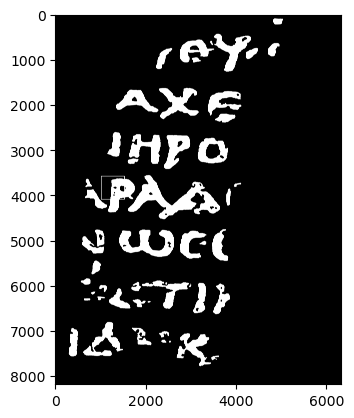

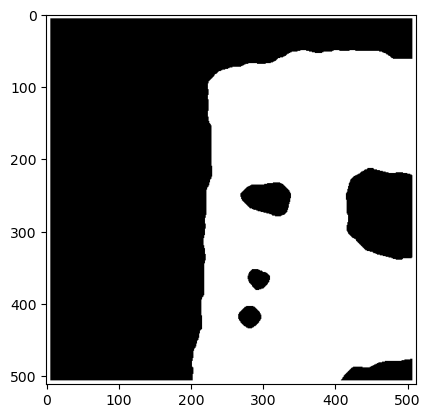

In [114]:
inklabel_path = os.path.join(INPUT_DIR, "train", "1", "inklabels.png")
label = cv2.imread(inklabel_path, cv2.IMREAD_GRAYSCALE)

print(label.shape)

grid_idx = [7, 2]
img_size = [512, 512]

print(label.shape[0]//img_size[0])

label_grid = label[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]

label = cv2.rectangle(label, [grid_idx[1]*img_size[1], grid_idx[0]*img_size[0]], [(grid_idx[1]+1)*img_size[1], (grid_idx[0]+1)*img_size[0]], 255, 10)

plt.figure()
plt.imshow(label, cmap="gray")
plt.show()

plt.figure()
plt.imshow(label_grid, cmap="gray")
plt.show()

In [90]:
surface_path_list = glob.glob(os.path.join(INPUT_DIR, "train", "1", "surface_volume", "*.tif"))
print(len(surface_path_list))
surface_vol_list = []
for path in surface_path_list:
    surface_vol_list.append(cv2.imread(path, cv2.IMREAD_GRAYSCALE))

65


-- 0 to 10 ---
original surface


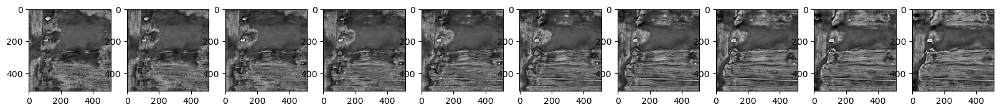

highpass_filter


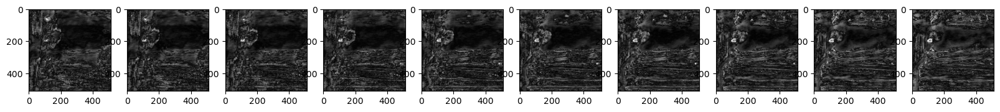

[26.155580520629883, 25.868831634521484, 25.818172454833984, 25.934673309326172, 26.12650489807129, 26.59130096435547, 27.298908233642578, 28.167194366455078, 29.00226402282715, 29.695735931396484]
lowpass_filter


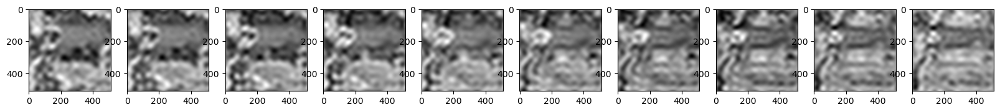

[86.93994903564453, 86.09846496582031, 85.81945037841797, 86.00563049316406, 86.53800201416016, 87.33372497558594, 88.41065979003906, 89.84452819824219, 91.68712615966797, 93.88141632080078]
-- 10 to 20 --
original surface


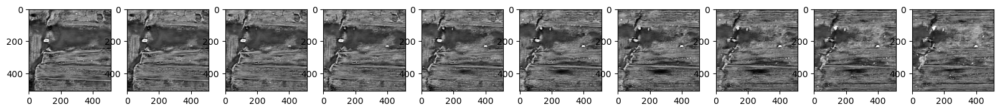

highpass_filter


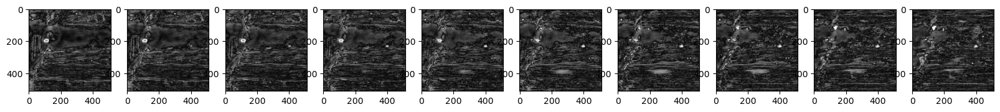

[30.136816024780273, 30.27246856689453, 30.129241943359375, 30.047903060913086, 30.266115188598633, 30.307472229003906, 29.830097198486328, 29.286943435668945, 29.120893478393555, 29.18599510192871]
lowpass_filter


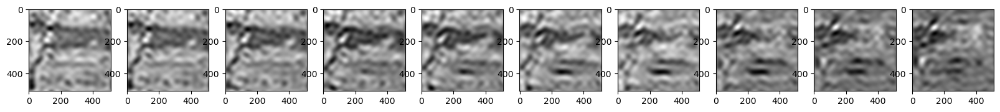

[96.15925598144531, 98.14513397216797, 99.47542572021484, 100.02888488769531, 99.94962310791016, 99.5710678100586, 99.33324432373047, 99.52437591552734, 100.25538635253906, 101.43505859375]
-- 20 to 30 ---
original surface


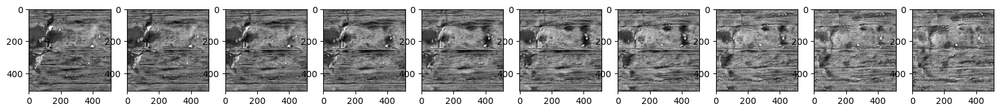

highpass_filter


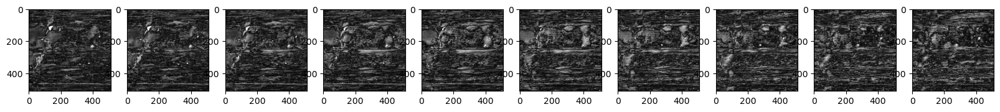

[29.34990119934082, 29.733684539794922, 30.327301025390625, 30.92308807373047, 31.436199188232422, 31.66533088684082, 31.102603912353516, 29.96055793762207, 28.793054580688477, 28.817485809326172]
lowpass_filter


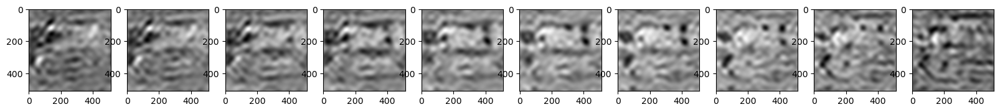

[102.91712188720703, 104.55564880371094, 106.32848358154297, 108.33080291748047, 110.84870910644531, 114.15205383300781, 118.154296875, 122.06613159179688, 124.41470336914062, 123.43780517578125]
-- 30 to 40 ---
original surface


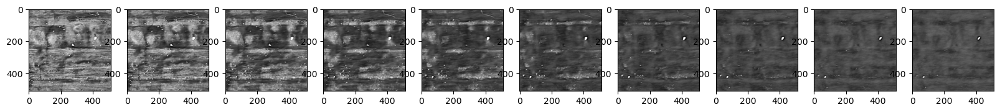

highpass_filter


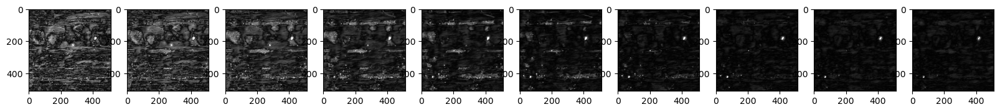

[30.784500122070312, 32.6711311340332, 31.474008560180664, 26.680740356445312, 20.12932014465332, 14.45458984375, 11.00241470336914, 9.424549102783203, 8.832104682922363, 8.232609748840332]
lowpass_filter


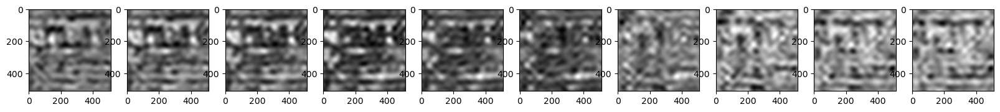

[117.97069549560547, 108.29905700683594, 96.26849365234375, 84.51618957519531, 75.33439636230469, 69.88935852050781, 68.16863250732422, 69.31842041015625, 72.1277847290039, 75.49937438964844]
-- 40 to 50 ---
original surface


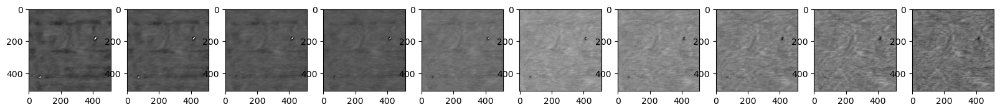

highpass_filter


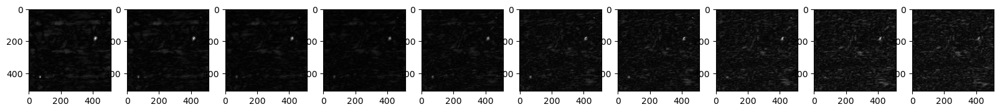

[7.35186767578125, 6.357529163360596, 5.466307163238525, 4.771190166473389, 4.308671951293945, 4.024018287658691, 3.8320558071136475, 3.6812751293182373, 3.545966625213623, 3.4218573570251465]
lowpass_filter


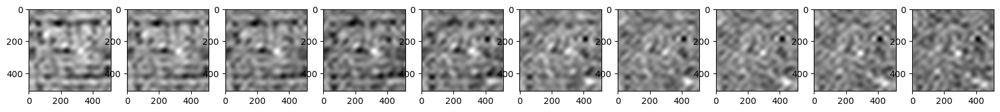

[78.71492004394531, 81.4328384399414, 83.57271575927734, 85.1991195678711, 86.42536163330078, 87.36544799804688, 88.10598754882812, 88.69963073730469, 89.15691375732422, 89.4833755493164]
-- 50 to 60 ---
original surface


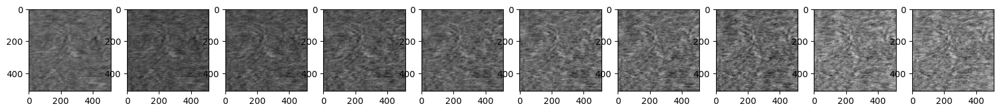

highpass_filter


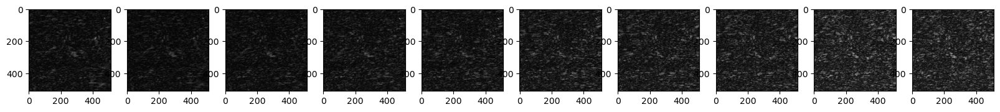

[3.333159923553467, 3.2602949142456055, 3.191277027130127, 3.1322646141052246, 3.10050630569458, 3.0849456787109375, 3.0643279552459717, 3.0287117958068848, 2.980954885482788, 2.9499688148498535]
lowpass_filter


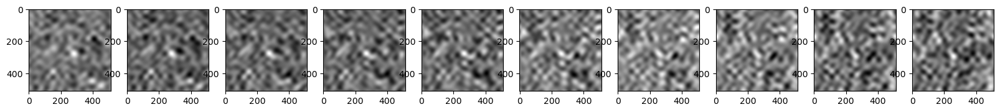

[89.69480895996094, 89.81587982177734, 89.87738800048828, 89.90267944335938, 89.9208755493164, 89.94397735595703, 89.98662567138672, 90.04216003417969, 90.11609649658203, 90.20075225830078]
-- 60 to 65 ---
original surface


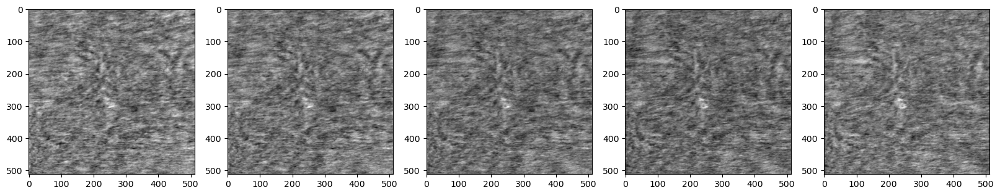

highpass_filter


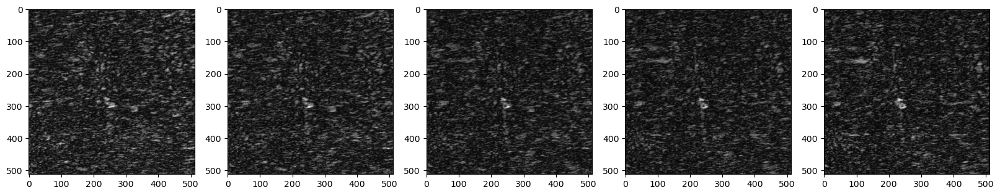

[2.949810266494751, 2.947657823562622, 2.9179186820983887, 2.8578927516937256, 2.8012428283691406]
lowpass_filter


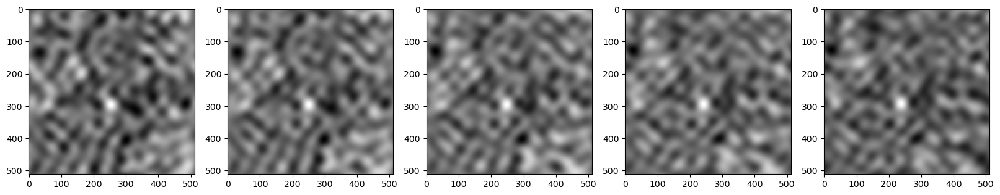

[90.2863540649414, 90.3469467163086, 90.3807601928711, 90.38665008544922, 90.38093566894531]


In [147]:
print("-- 0 to 10 ---")
subplot_num = np.arange(0,10)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 10 to 20 --")
subplot_num = np.arange(10,20)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 20 to 30 ---")
subplot_num = np.arange(20,30)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 30 to 40 ---")
subplot_num = np.arange(30,40)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 40 to 50 ---")
subplot_num = np.arange(40,50)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 50 to 60 ---")
subplot_num = np.arange(50,60)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 60 to 65 ---")
subplot_num = np.arange(60,65)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# train - 2

(14830, 9506)
28


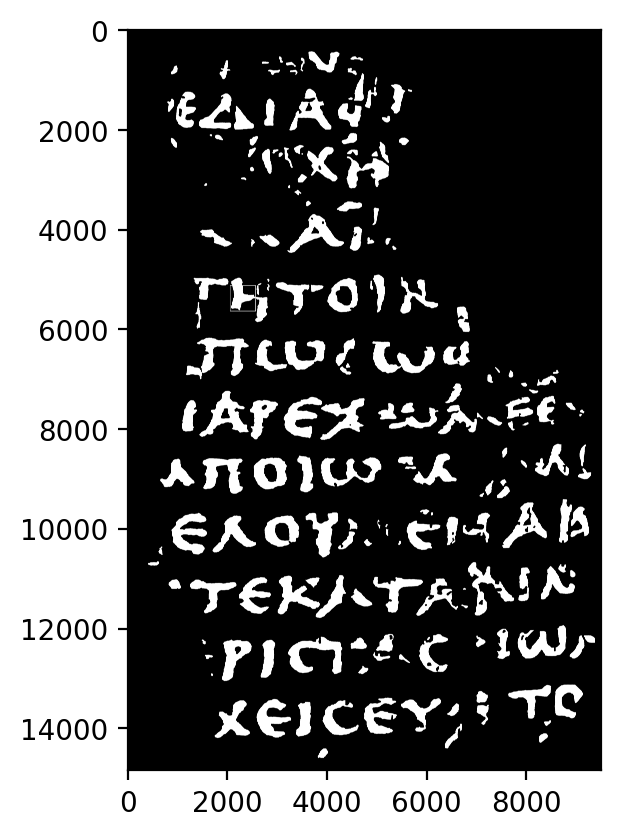

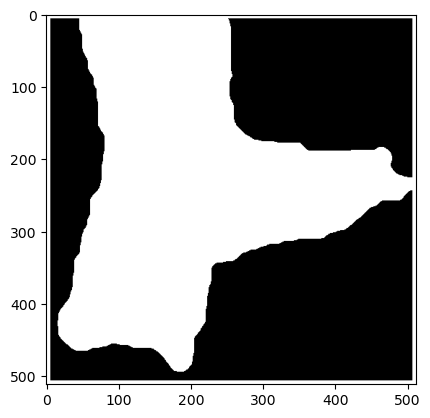

In [152]:
inklabel_path = os.path.join(INPUT_DIR, "train", "2", "inklabels.png")
label = cv2.imread(inklabel_path, cv2.IMREAD_GRAYSCALE)

print(label.shape)

grid_idx = [10, 4]
img_size = [512, 512]

print(label.shape[0]//img_size[0])

label_grid = label[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]

label = cv2.rectangle(label, [grid_idx[1]*img_size[1], grid_idx[0]*img_size[0]], [(grid_idx[1]+1)*img_size[1], (grid_idx[0]+1)*img_size[0]], 255, 10)

plt.figure(dpi=200)
plt.imshow(label, cmap="gray")
plt.show()

plt.figure()
plt.imshow(label_grid, cmap="gray")
plt.show()

In [153]:
surface_path_list = glob.glob(os.path.join(INPUT_DIR, "train", "2", "surface_volume", "*.tif"))
print(len(surface_path_list))
surface_vol_list = []
for path in surface_path_list:
    surface_vol_list.append(cv2.imread(path, cv2.IMREAD_GRAYSCALE))

65


-- 0 to 10 ---
original surface


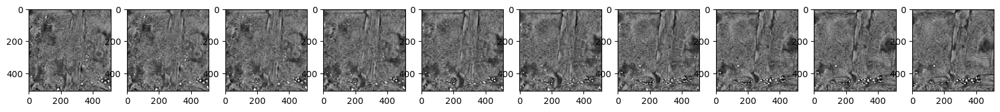

highpass_filter


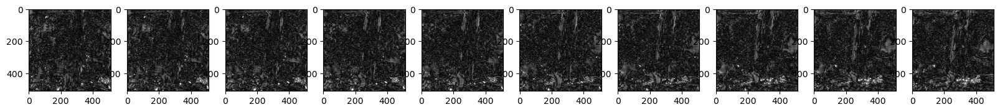

[22.631807327270508, 22.5875301361084, 22.621278762817383, 22.752214431762695, 22.881410598754883, 22.970123291015625, 22.984636306762695, 23.030351638793945, 23.100563049316406, 23.08696937561035]
lowpass_filter


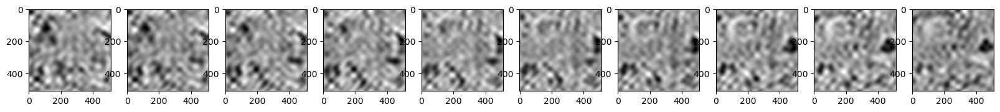

[103.55049133300781, 103.59008026123047, 103.50249481201172, 103.36671447753906, 103.25154876708984, 103.21403503417969, 103.23524475097656, 103.34210205078125, 103.51285552978516, 103.69330596923828]
-- 10 to 20 --
original surface


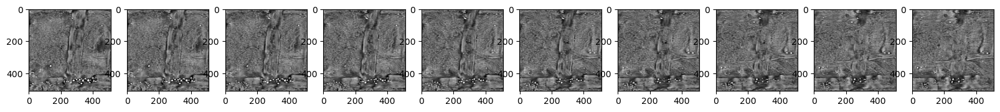

highpass_filter


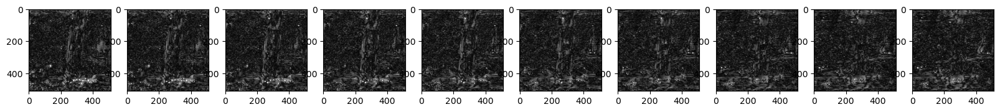

[22.998910903930664, 22.96385955810547, 23.070959091186523, 23.228839874267578, 23.211729049682617, 22.9373779296875, 22.59029769897461, 22.281888961791992, 22.12041473388672, 21.980995178222656]
lowpass_filter


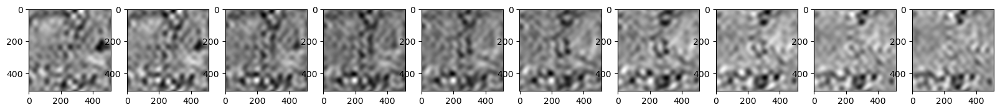

[103.84375, 103.79554748535156, 103.45758056640625, 102.89596557617188, 102.30242156982422, 101.9366683959961, 102.00077056884766, 102.55216979980469, 103.45948028564453, 104.52143096923828]
-- 20 to 30 ---
original surface


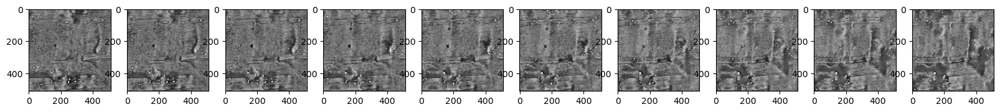

highpass_filter


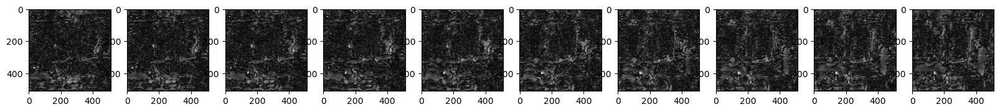

[21.856550216674805, 21.78253746032715, 21.8065185546875, 21.9687442779541, 22.29828453063965, 22.71857261657715, 23.200443267822266, 23.71977996826172, 24.42900848388672, 25.28900718688965]
lowpass_filter


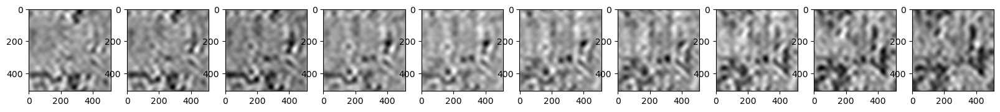

[105.65266418457031, 106.88441467285156, 108.24349975585938, 109.7282485961914, 111.25328826904297, 112.7239990234375, 113.94021606445312, 114.64588165283203, 114.57781219482422, 113.55081176757812]
-- 30 to 40 ---
original surface


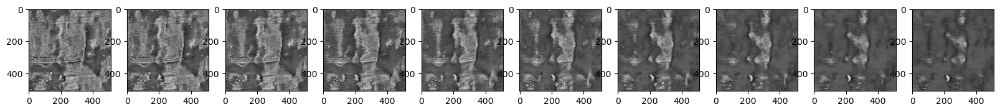

highpass_filter


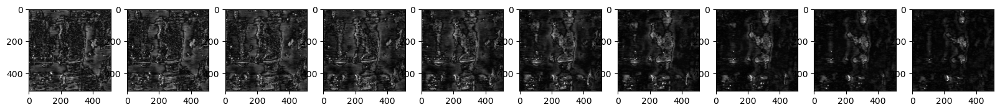

[26.150419235229492, 26.708314895629883, 26.788442611694336, 25.933208465576172, 23.794452667236328, 20.65032196044922, 17.277828216552734, 14.299477577209473, 11.955838203430176, 10.262252807617188]
lowpass_filter


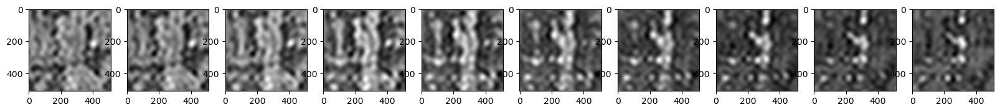

[111.5036392211914, 108.52539825439453, 104.8678207397461, 100.86199951171875, 96.80126953125, 93.02058410644531, 89.79560852050781, 87.36461639404297, 85.84249114990234, 85.179443359375]
-- 40 to 50 ---
original surface


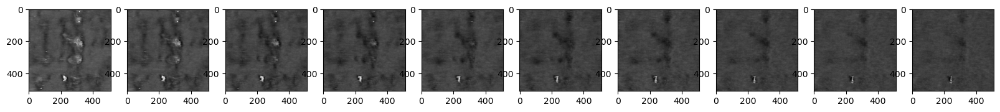

highpass_filter


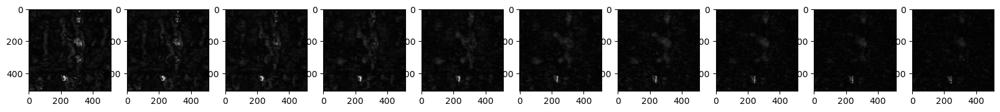

[9.082275390625, 8.288990020751953, 7.699447154998779, 7.090472221374512, 6.4461565017700195, 5.817967891693115, 5.243254661560059, 4.746005058288574, 4.325120449066162, 3.979954957962036]
lowpass_filter


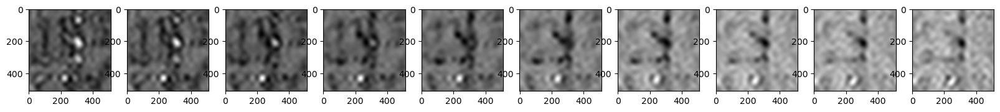

[85.22359466552734, 85.81598663330078, 86.78834533691406, 87.95427703857422, 89.17239379882812, 90.35210418701172, 91.43170166015625, 92.40056610107422, 93.23673248291016, 93.92621612548828]
-- 50 to 60 ---
original surface


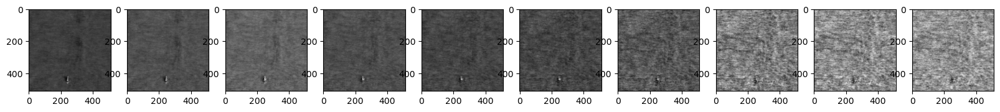

highpass_filter


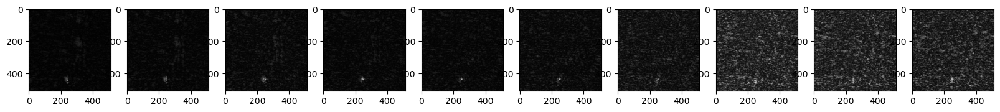

[3.7072904109954834, 3.5363895893096924, 3.450005054473877, 3.373835802078247, 3.286165714263916, 3.201953649520874, 3.127337694168091, 3.072908639907837, 3.0592806339263916, 3.0726354122161865]
lowpass_filter


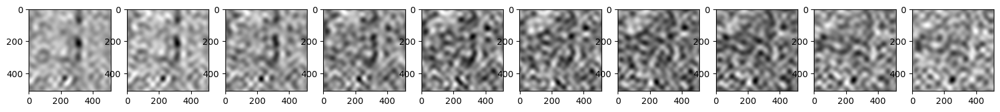

[94.48208618164062, 94.9345703125, 95.30488586425781, 95.61077880859375, 95.8536605834961, 96.00807189941406, 96.0749282836914, 96.07769775390625, 96.05339050292969, 96.03956604003906]
-- 60 to 65 ---
original surface


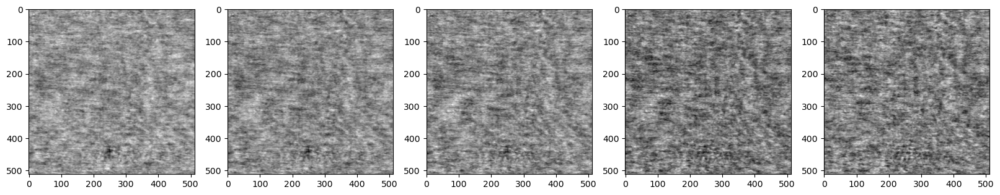

highpass_filter


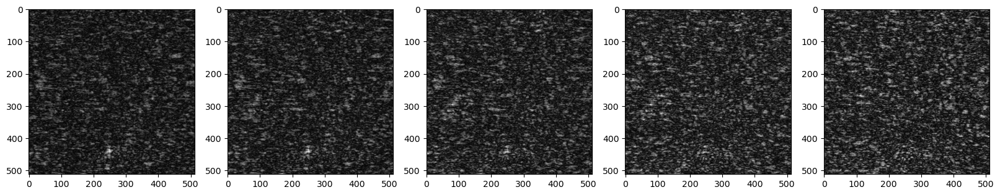

[3.088624954223633, 3.075817584991455, 3.0338358879089355, 2.984511375427246, 2.9580376148223877]
lowpass_filter


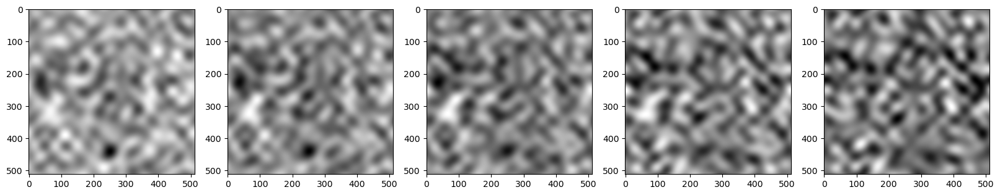

[96.0592041015625, 96.11299133300781, 96.18568420410156, 96.2488021850586, 96.2993392944336]


In [154]:
print("-- 0 to 10 ---")
subplot_num = np.arange(0,10)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 10 to 20 --")
subplot_num = np.arange(10,20)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 20 to 30 ---")
subplot_num = np.arange(20,30)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 30 to 40 ---")
subplot_num = np.arange(30,40)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 40 to 50 ---")
subplot_num = np.arange(40,50)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 50 to 60 ---")
subplot_num = np.arange(50,60)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 60 to 65 ---")
subplot_num = np.arange(60,65)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# train - 3

(7606, 5249)
14


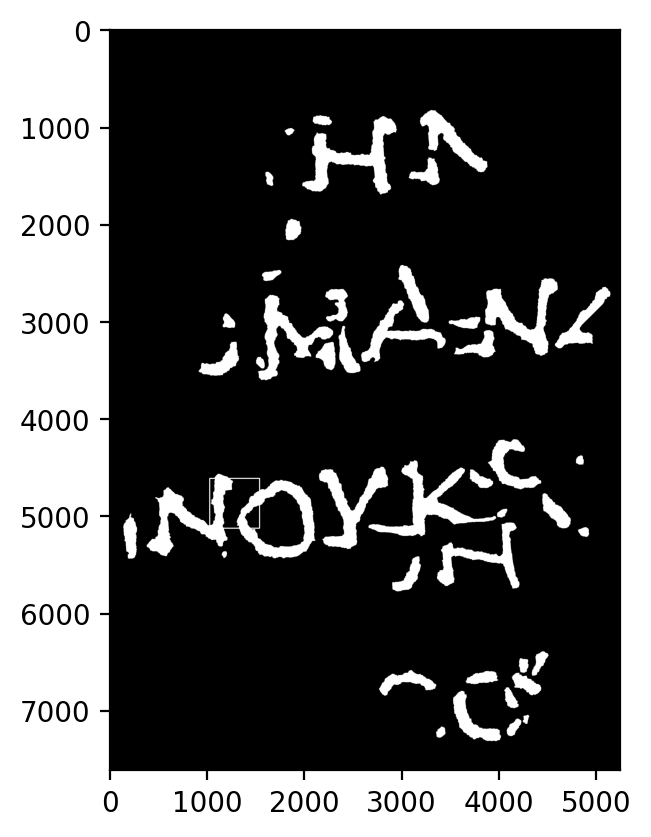

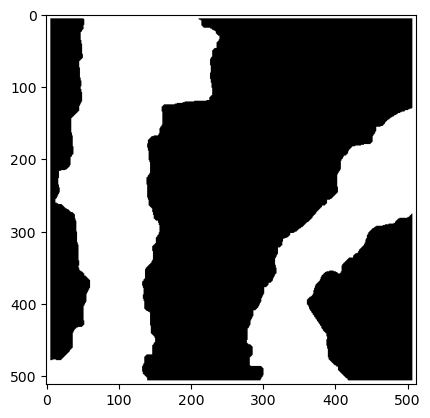

In [159]:
inklabel_path = os.path.join(INPUT_DIR, "train", "3", "inklabels.png")
label = cv2.imread(inklabel_path, cv2.IMREAD_GRAYSCALE)

print(label.shape)

grid_idx = [9, 2]
img_size = [512, 512]

print(label.shape[0]//img_size[0])

label_grid = label[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]

label = cv2.rectangle(label, [grid_idx[1]*img_size[1], grid_idx[0]*img_size[0]], [(grid_idx[1]+1)*img_size[1], (grid_idx[0]+1)*img_size[0]], 255, 10)

plt.figure(dpi=200)
plt.imshow(label, cmap="gray")
plt.show()

plt.figure()
plt.imshow(label_grid, cmap="gray")
plt.show()

In [160]:
surface_path_list = glob.glob(os.path.join(INPUT_DIR, "train", "3", "surface_volume", "*.tif"))
print(len(surface_path_list))
surface_vol_list = []
for path in surface_path_list:
    surface_vol_list.append(cv2.imread(path, cv2.IMREAD_GRAYSCALE))

65


-- 0 to 10 ---
original surface


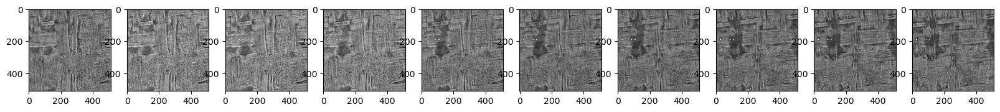

highpass_filter


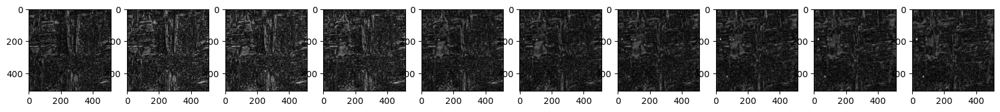

[17.047340393066406, 17.07025146484375, 17.208898544311523, 17.458213806152344, 17.781024932861328, 18.135496139526367, 18.434547424316406, 18.70614242553711, 19.006399154663086, 19.283998489379883]
lowpass_filter


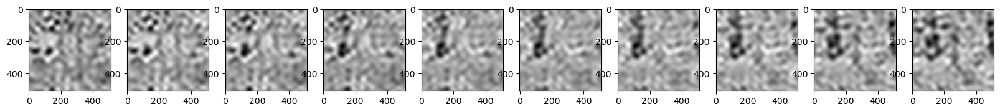

[105.65067291259766, 105.68804931640625, 105.70748901367188, 105.6654052734375, 105.45240783691406, 105.00635528564453, 104.3911361694336, 103.78370666503906, 103.3543701171875, 103.17076110839844]
-- 10 to 20 --
original surface


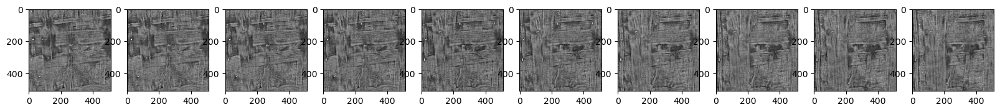

highpass_filter


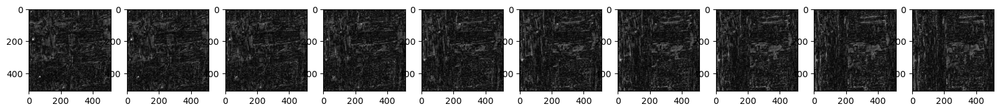

[19.45822525024414, 19.432586669921875, 19.184019088745117, 18.891210556030273, 18.68743324279785, 18.634389877319336, 18.74307632446289, 18.87425994873047, 18.798076629638672, 18.50286865234375]
lowpass_filter


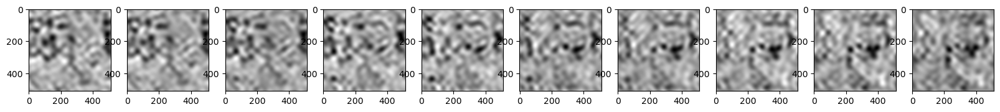

[103.20076751708984, 103.41609191894531, 103.84022521972656, 104.47770690917969, 105.23921203613281, 105.99568176269531, 106.67510223388672, 107.3572769165039, 108.18533325195312, 109.29048919677734]
-- 20 to 30 ---
original surface


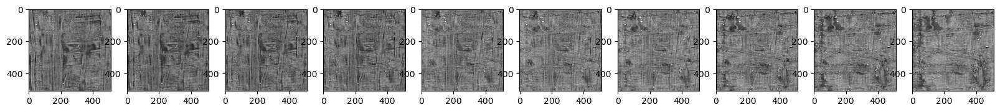

highpass_filter


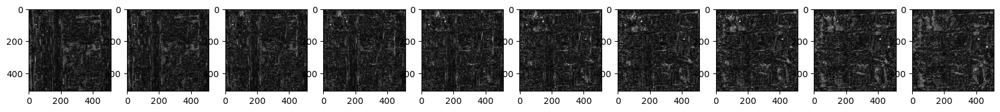

[18.116342544555664, 17.723262786865234, 17.44837188720703, 17.34031105041504, 17.40093994140625, 17.626293182373047, 18.102197647094727, 18.96232795715332, 20.097217559814453, 21.219087600708008]
lowpass_filter


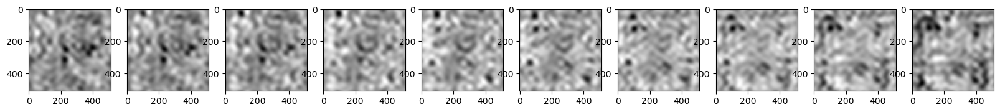

[110.77635192871094, 112.70721435546875, 115.06036376953125, 117.73624420166016, 120.52481079101562, 123.11742401123047, 125.0901870727539, 126.03652954101562, 125.61467742919922, 123.55432891845703]
-- 30 to 40 ---
original surface


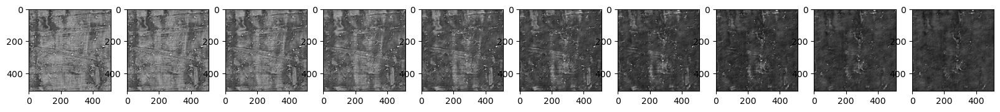

highpass_filter


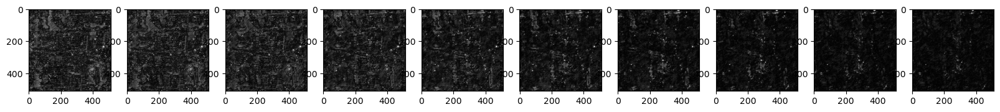

[22.041370391845703, 22.41466522216797, 22.090221405029297, 20.821636199951172, 18.51689338684082, 15.602413177490234, 12.806854248046875, 10.622611045837402, 9.098259925842285, 8.08165454864502]
lowpass_filter


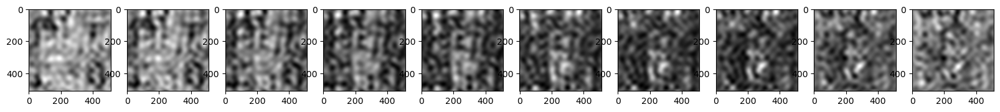

[119.71216583251953, 114.27811431884766, 107.88924407958984, 101.42988586425781, 95.69530487060547, 91.2144546508789, 88.21383666992188, 86.69144439697266, 86.4863052368164, 87.30528259277344]
-- 40 to 50 ---
original surface


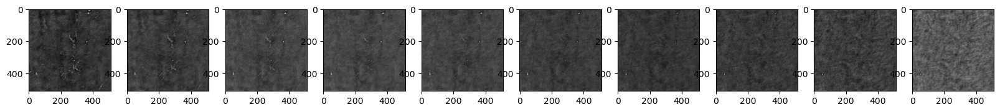

highpass_filter


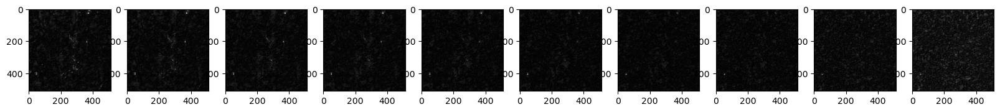

[7.363755226135254, 6.795754432678223, 6.3078131675720215, 5.877735137939453, 5.44870138168335, 5.030580520629883, 4.6808390617370605, 4.42254638671875, 4.282130241394043, 4.214668273925781]
lowpass_filter


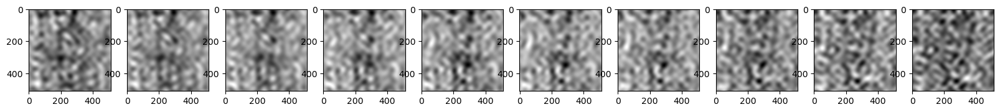

[88.7450180053711, 90.40689849853516, 92.03179168701172, 93.5020980834961, 94.78504943847656, 95.88450622558594, 96.83001708984375, 97.63859558105469, 98.28602600097656, 98.75672912597656]
-- 50 to 60 ---
original surface


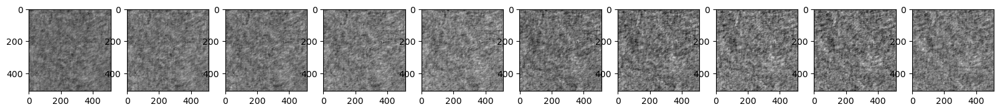

highpass_filter


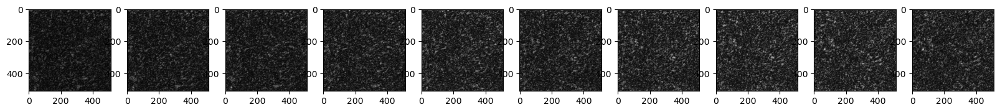

[4.158273220062256, 4.084825038909912, 4.005581378936768, 3.931814432144165, 3.884512424468994, 3.8501107692718506, 3.802696704864502, 3.7463438510894775, 3.6963958740234375, 3.682271957397461]
lowpass_filter


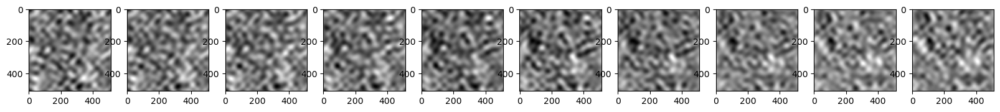

[99.09065246582031, 99.32884216308594, 99.47406768798828, 99.5431900024414, 99.56791687011719, 99.57868194580078, 99.5833511352539, 99.57351684570312, 99.55665588378906, 99.55537414550781]
-- 60 to 65 ---
original surface


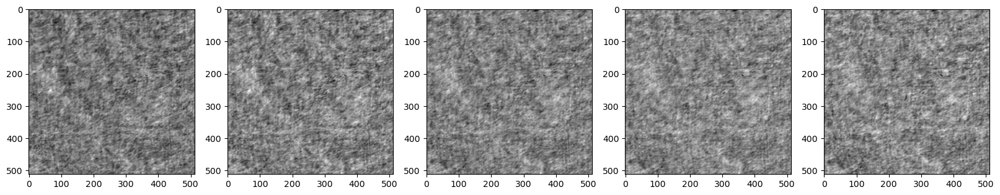

highpass_filter


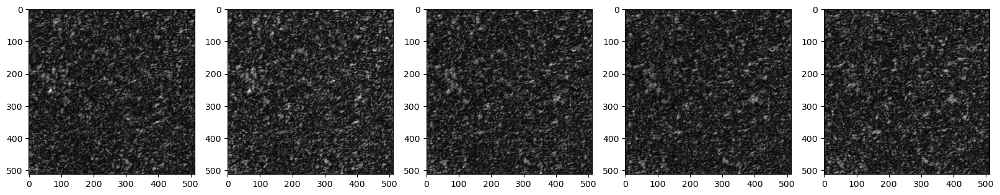

[3.694063901901245, 3.6980812549591064, 3.6763222217559814, 3.644299268722534, 3.610729217529297]
lowpass_filter


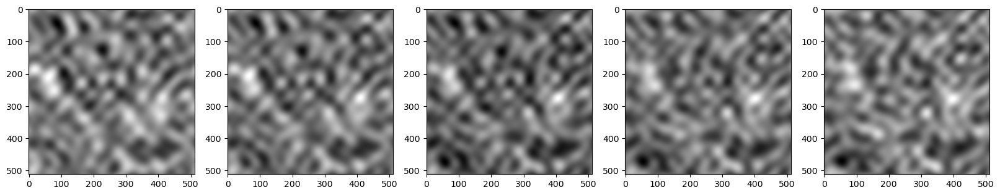

[99.5813217163086, 99.62112426757812, 99.6534423828125, 99.66692352294922, 99.66779327392578]


In [161]:
print("-- 0 to 10 ---")
subplot_num = np.arange(0,10)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 10 to 20 --")
subplot_num = np.arange(10,20)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 20 to 30 ---")
subplot_num = np.arange(20,30)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 30 to 40 ---")
subplot_num = np.arange(30,40)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 40 to 50 ---")
subplot_num = np.arange(40,50)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 50 to 60 ---")
subplot_num = np.arange(50,60)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

print("-- 60 to 65 ---")
subplot_num = np.arange(60,65)
plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)